# Assignment - Clustering - revised

### Objectives:

* Interpret the output of a K-means cluster analysis.
* Perform K-means clustering in R using `k-means`
* Visualize the output of K-means clustering in R using a coloured scatter plot 
* Use the elbow method to choose the number of clusters for K-means

In [1]:
### Run this cell before continuing.
library(tidyverse)
library(tidymodels)
library(tidyclust)
library(repr)
library(GGally)
options(repr.matrix.max.rows = 6)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.1     ✔ stringr   1.5.2
✔ ggplot2   4.0.0     ✔ tibble    3.3.0
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.4.1 ──

✔ broom        1.0.10     ✔ rsample      1.3.1 
✔ dials        1.4.2      ✔ tailor       0.1.0 
✔ infer        1.0.9      ✔ tune         2.0.0 
✔ modeldata    1.5.1      ✔ workflows    1.3.0 
✔ parsnip      1.3.3      ✔ workflowsets 1.1.1 
✔ recipes      1.3.1      ✔ yardstick    1.3.2 

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() mask

# 1. Pokemon

We will be working with the Pokemon dataset from Kaggle, which can be found [here.](https://www.kaggle.com/abcsds/pokemon)
This dataset compiles the statistics on 721 Pokemon. The information in this dataset includes Pokemon name, type, health points, attack strength, defensive strength, speed points etc. These are values that apply to a Pokemon's abilities (higher values are better). We are interested in seeing if there are any sub-groups/clusters of pokemon based on these statistics. And if so, how many sub-groups/clusters there are.

**Question 1.0**
<br> {points: 1}

Use `read_csv` to load `pokemon.csv` from the `data/` folder.

*Assign your answer to an object called `pokemon_full`.*

In [2]:
# your code here
pokemon_full <- read.csv("data/pokemon.csv")

pokemon_full

X.,Name,Type.1,Type.2,Total,HP,Attack,Defense,Sp..Atk,Sp..Def,Speed,Generation,Legendary
<int>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True
721,Volcanion,Fire,Water,600,80,110,120,130,90,70,6,True


**Question 1.1**
<br> {points: 1}

To start exploring the Pokemon data, create a scatter plot matrix (or pairplot) using `ggpairs`. The plot should only contain the columns `Total` to `Speed` from `pokemon_full`. You can check the data wrangling chapter in the textbook to recall how to select a range of columns using select with :.

*Assign your answer to an object called `pokemon_pairs`. Make sure to set a suitable size for the plot.*

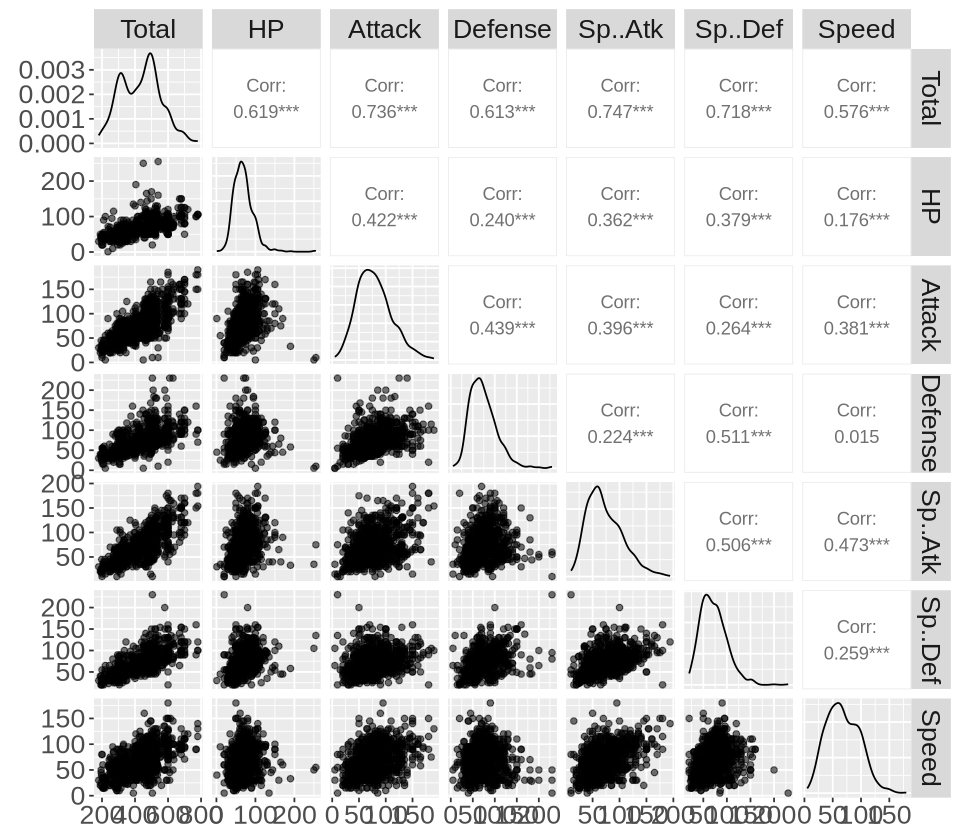

In [3]:
# options(...)
#
# ... <- pokemon_full |> ... |>
#     ggpairs(aes(alpha = 0.05)) +
#     theme(text = element_text(size = 20))

# your code here
options(repr.plot.width = 8, repr.plot.height = 7)#

pokemon_pairs <- pokemon_full |> select("Total":"Speed") |>
     ggpairs(aes(alpha = 0.05)) +
     theme(text = element_text(size = 20))


pokemon_pairs
     

**Question 1.2** 
<br> {points: 1}

From the pairplot above, it does not look like the pokemon are separated into clear groups in any of the pairwise variable scatterplots. Here, we will continue exploring the relationship between `Speed` and `Defense` and see what happens if we try to cluster the data points on these two variables although there are no visually discernable variables in the chart.

First, select the columns `Speed` and `Defense`, creating a new dataframe with only those columns.

*Assign your answer to an object named `pokemon`.*

In [4]:
# your code here

pokemon <- pokemon_full |> 
        select(Speed, Defense)

pokemon

Speed,Defense
<int>,<int>
45,49
60,63
80,83
⋮,⋮
70,60
80,60
70,120


**Question 1.3**
<br> {points: 1}

Next, create a scatter plot of only these two variables so that we can look more closely at their relationship. Put the `Speed` variable on the x-axis, and the `Defense` variable on the y-axis.

*Assign your plot to an object called *pokemon_scatter*. Don't forget to do everything needed to make an effective visualization, including setting an appropriate alpha value of the points.*

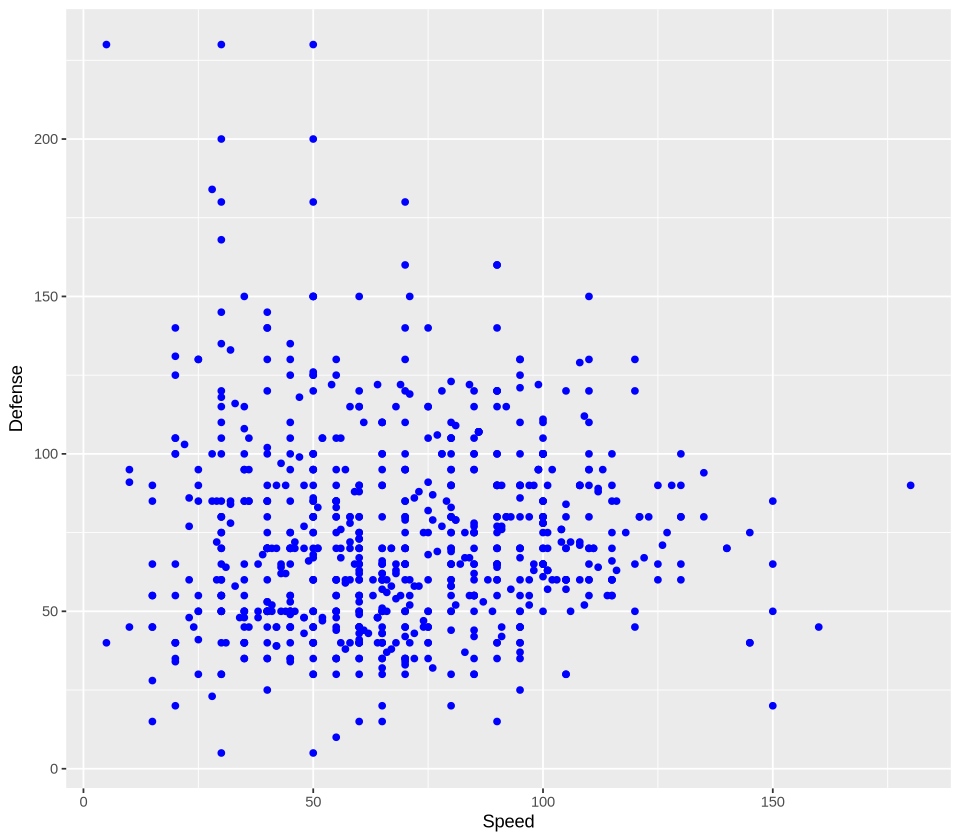

In [5]:
# your code here
pokemon_scatter <- pokemon |>
        ggplot(aes(x = Speed, y = Defense)) +
        geom_point(color = "blue") +
        labs(x = "Speed", y = "Defense")

pokemon_scatter
     

**Question 1.4.1** 
<br> {points: 3}

The chart above confirms what we saw in the pairplot; there doesn't seem to be visually distinct clusters of points in these two dimensions. Could it still be informative to run clustering with this data? Let's find out by using K-Means to cluster the Pokemon based on their Speed and Defense.

So far when using K-Means, we have scaled our input features. Will it matter much for our clustering if we scale our variables for the pokemon data? Is there any argument against scaling here?

##### Answer: Since the spread for `Speed` and `Defense` are fairly similar, scaling our variables is not likely to matter much for this data. However, the spreads are not identical, so it is probably still a good idea to scale. <br><br> We might choose to avoid scaling if the base units themselves carried a meaningful weight, or if we did want one of the variable to exert slightly more influence because of slightly greater spread.

**Question 1.4.2**
<br> {points: 3}

Now, let's use K-means to cluster the Pokemon based on their Speed and Defense variables.

* Create a recipe named `pokemon_recipe` that standardizes the data
* Create a model specification named `pokemon_spec` for K-means clustering with 4 clusters.
* Fit the model using a tidymodels workflow; call the output of the `fit()` function pokemon_clustering.

*Assign your answers to objects called `pokemon_recipe`, `pokemon_spec`, and `pokemon_clustering`.*

**Note:** We set the random seed here because K-means initializes observations to random clusters.

In [6]:
#DON'T CHANGE THE SEED VALUE BELOW!
set.seed(2019)

# your code here
pokemon_recipe <- recipe( ~ . , data = pokemon) |> 
        step_scale(all_predictors()) |>
        step_center(all_predictors())
pokemon_recipe

pokemon_spec <- k_means(num_clusters = 4) |>
        set_engine("stats")
pokemon_spec

pokemon_clustering <- workflow() |>
    add_recipe(pokemon_recipe) |>
    add_model(pokemon_spec) |>
    fit(data = pokemon)
pokemon_clustering



── Recipe ──────────────────────────────────────────────────────────────────────



── Inputs 

Number of variables by role

predictor: 2



── Operations 

• Scaling for: all_predictors()

• Centering for: all_predictors()



K Means Cluster Specification (partition)

Main Arguments:
  num_clusters = 4

Computational engine: stats 


══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: k_means()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-means clustering with 4 clusters of sizes 259, 262, 99, 180

Cluster means:
       Speed     Defense
4 -0.5486990 -0.89261236
2  1.1055250 -0.03986927
3 -0.1256427  1.86306518
1 -0.7505326  0.31771609

Clustering vector:
  [1] 1 1 2 3 1 2 2 2 2 4 4 3 3 1 1 1 1 1 1 2 1 1 2 2 1 2 1 2 1 2 2 2 4 3 1 4 2
 [38] 1 1 2 1 4 1 2 1 1 1 2 1 4 4 1 4 1 2 2 2 2 2 1 2 1 2 1 2 2 2 4 1 2 2 2 1 4
 [75] 4 1 1 1 1 2 4 4 3 2 2 4 4 3 4 4 1 1 2 1 4 1 4 4 3 1 2 2 2 3 1 4 4 3 2 2 4
[112] 4 4 4 2 2 4 4 3 4 3 1 3 2 2 4 2 1 1 2 2 2 2 2 2 2 2 3 2 2 2 3 4 1 1 1 2 1
[149] 4 4 3 4 3 2 2 4 2 2 2 1 1 2 2 2 2 2 4 4 2 1 2 2 4 4 3 1 2 1 1 1 2 1 4 2 1
[186] 1 1 1 1 4 4 1 2 1 1 4 4 4 1 4 4 4 1 1 2 2

**Question 1.5**
<br> {points: 3}

Let's visualize the clusters we built in `pokemon_clustering`. Use the `augment` function to create a dataframe called `clustered_pokemon`, then create a coloured scatter plot of `Speed` (x-axis) vs `Defense` (y-axis), with the points coloured by their cluster assignment.

Name this plot `pokemon_clustering_plot`.

.pred_cluster,Speed,Defense
<fct>,<int>,<int>
Cluster_1,45,49
Cluster_1,60,63
Cluster_2,80,83
⋮,⋮,⋮
Cluster_1,70,60
Cluster_2,80,60
Cluster_3,70,120


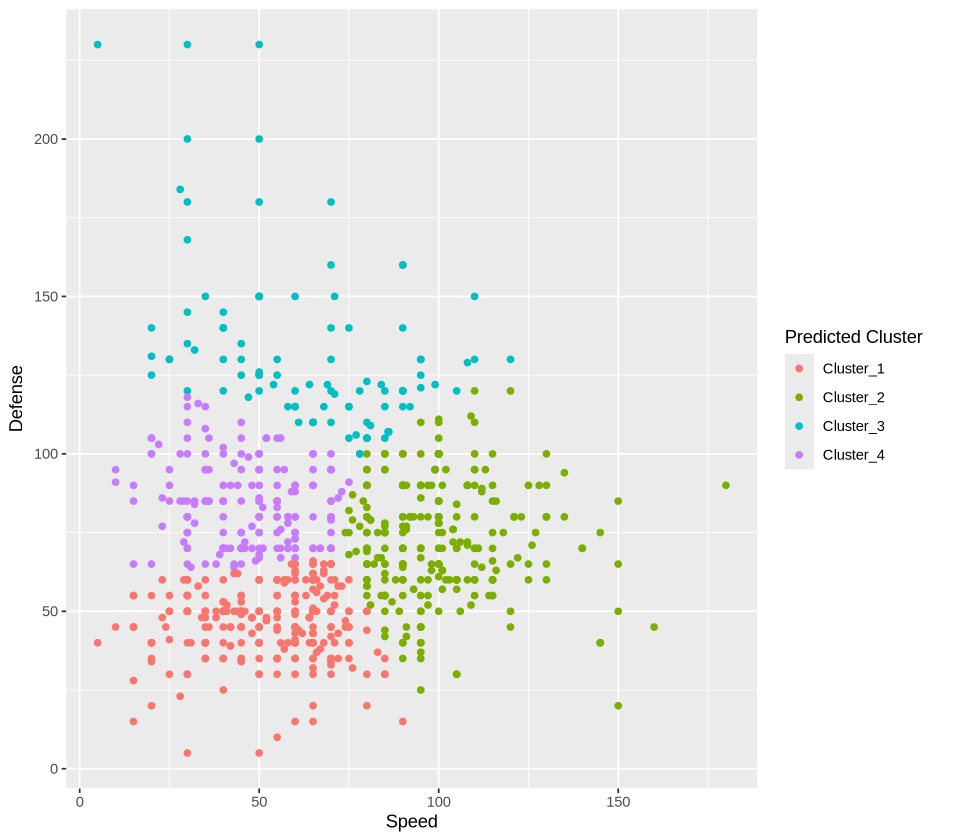

In [7]:
# your code here
clustered_pokemon <- augment(pokemon_clustering, pokemon)
clustered_pokemon

pokemon_clustering_plot <- clustered_pokemon |>
        ggplot(aes(x = Speed, y = Defense, color = .pred_cluster)) +
        geom_point() +
        labs(x = "Speed", y = "Defense", color = "Predicted Cluster" )


pokemon_clustering_plot

**Question 1.6**
<br> {points: 3}

Below you can see multiple initializations of k-means with different seeds for `K = 4`. Can you explain what is happening and how we can mitigate this in the `k_means` function?

![](img/multiple_initializations.png)

Below you can see multiple initializations of k-means with different seeds for K = 4. Can you explain what is happening and how we can mitigate this in the k_means function?

##### Answer: K-means is sensitive to initialization. Different random starts can lead to different local minima, especially when the data do not contain strong cluster structure. To mitigate this, we could run K-means multiple times with different initializations and retain the solution with the lowest within-cluster sum of squares.

**Question 1.7**
<br> {points: 3}

We know that comparing how the WSSD varies for multiple values of $K$ is an important step of selecting a suitable clustering model. That's what we will do next!

For this exercise, you will calculate the total within-cluster sum-of-squared distances for $K$ = 1 to $K$ = 10.

1. Create a tibble with the desired values of $K$.
2. Create a new model specification that sets `nstart` to 10 and tells `k_means` you want to tune the number of clusters.
3. Create a new workflow that uses `tune_cluster` to tune the number of clusters
4. Use the `collect_metrics` function to collect the results.
5. Use `filter`, `select`, and `mutate` functions to construct a tibble with two columns named `num_clusters` and `total_WSSD`. Store that tibble in an object named `elbow_stats`.


*Assign your answer to a tibble object named `elbow_stats`. It should have the columns `num_clusters` and `total_WSSD`.*

In [8]:
set.seed(2020) # DO NOT REMOVE

# your code here
pokemon_ks <- tibble(num_clusters = 1:10)
pokemon_ks

pokemon_spec_tune <- k_means(num_clusters = tune()) |>
        set_engine("stats", nstart = 10)
pokemon_spec_tune

pokemon_tuning_stats <- workflow() |>
        add_recipe(pokemon_recipe) |>
        add_model(pokemon_spec_tune) |>
        tune_cluster(resamples = apparent(pokemon), grid = pokemon_ks) #|>
#        collect_metrics()
pokemon_tuning_stats <- pokemon_tuning_stats$.metrics[[1]]

pokemon_tuning_stats

elbow_stats <- pokemon_tuning_stats |>
        filter(.metric == "sse_within_total") |>
        mutate(total_WSSD = .estimate) |>
        select(num_clusters, total_WSSD)

elbow_stats

num_clusters
<int>
1
2
3
⋮
8
9
10


K Means Cluster Specification (partition)

Main Arguments:
  num_clusters = tune()

Engine-Specific Arguments:
  nstart = 10

Computational engine: stats 


num_clusters,.metric,.estimator,.estimate,.config
<int>,<chr>,<chr>,<dbl>,<chr>
1,sse_within_total,standard,1598.00,Preprocessor1_Model01
1,sse_total,standard,1598.00,Preprocessor1_Model01
2,sse_within_total,standard,1031.46,Preprocessor1_Model02
⋮,⋮,⋮,⋮,⋮
9,sse_total,standard,1598.0000,Preprocessor1_Model09
10,sse_within_total,standard,214.2753,Preprocessor1_Model10
10,sse_total,standard,1598.0000,Preprocessor1_Model10


num_clusters,total_WSSD
<int>,<dbl>
1,1598.0000
2,1031.4596
3,640.4274
⋮,⋮
8,267.6408
9,235.6118
10,214.2753


**Question 1.8**
<br> {points: 1}

Let's visualize how WSSD changes for as we vary the value of $K$. To do this, create the elbow plot. Put the within-cluster sum of squares on the y-axis, and the number of clusters on the x-axis.

*Assign your plot to an object called `elbow_plot`*.

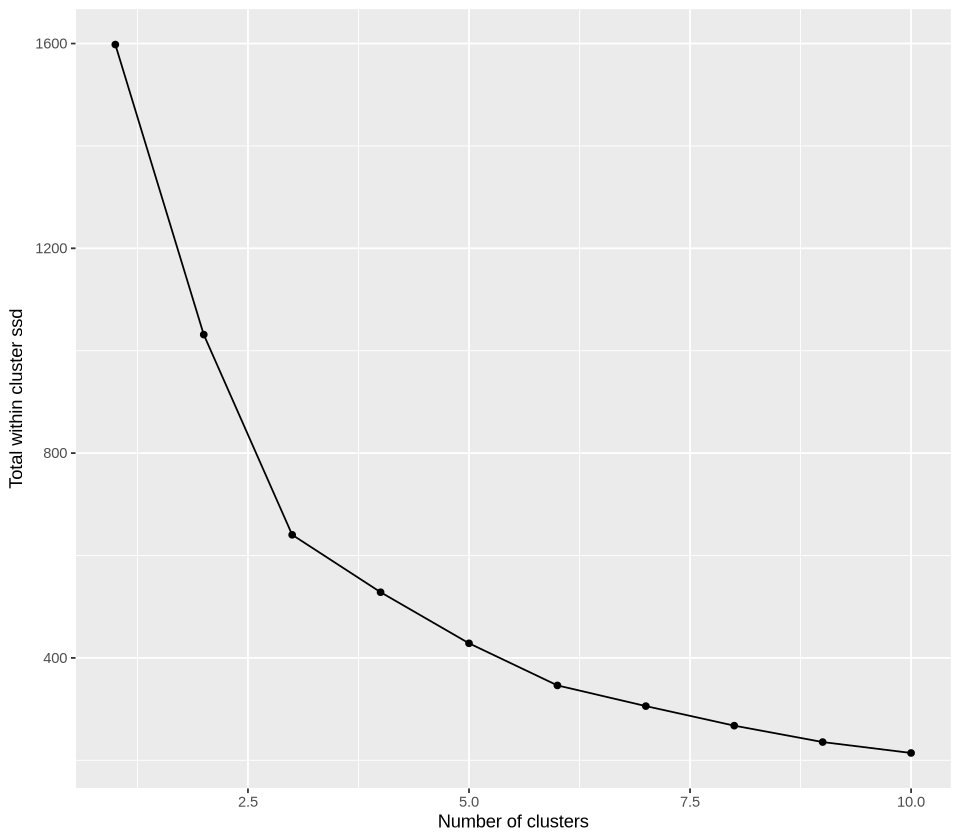

In [9]:
# your code here
elbow_plot <- elbow_stats |>
        ggplot(aes(x = num_clusters, y = total_WSSD)) +
        geom_line() + 
        geom_point() +
        labs(x = "Number of clusters", y = "Total within cluster ssd")

elbow_plot

**Question 1.9** 
<br> {points: 3}

Based on the elbow plot above, what value of $K$ would you choose? Explain why.

##### Answer: I would choose a value of $K$ of 3, since the change in total within cluster ssd decreases considerably for values of $K$ greater than 3. However, one might reasonably argue for a slightly higher value of $K$.  

**Question 1.10**
<br> {points: 3}

Using the value that you chose for k, perform the k-means algorithm, set `nstart = 10` and assign your answer to an object called `pokemon_final_kmeans`. 

Augment the data with the final cluster labels and assign your answer to an object called `pokemon_final_clusters`. 

Finally, create a plot called `pokemon_final_clusters_plot` to visualize the clusters. Include a title, colour the points by the cluster and make sure your axes are human-readable.

K Means Cluster Specification (partition)

Main Arguments:
  num_clusters = 3

Engine-Specific Arguments:
  nstart = 10

Computational engine: stats 


.pred_cluster,Speed,Defense
<fct>,<int>,<int>
Cluster_1,45,49
Cluster_1,60,63
Cluster_2,80,83
⋮,⋮,⋮
Cluster_1,70,60
Cluster_2,80,60
Cluster_3,70,120


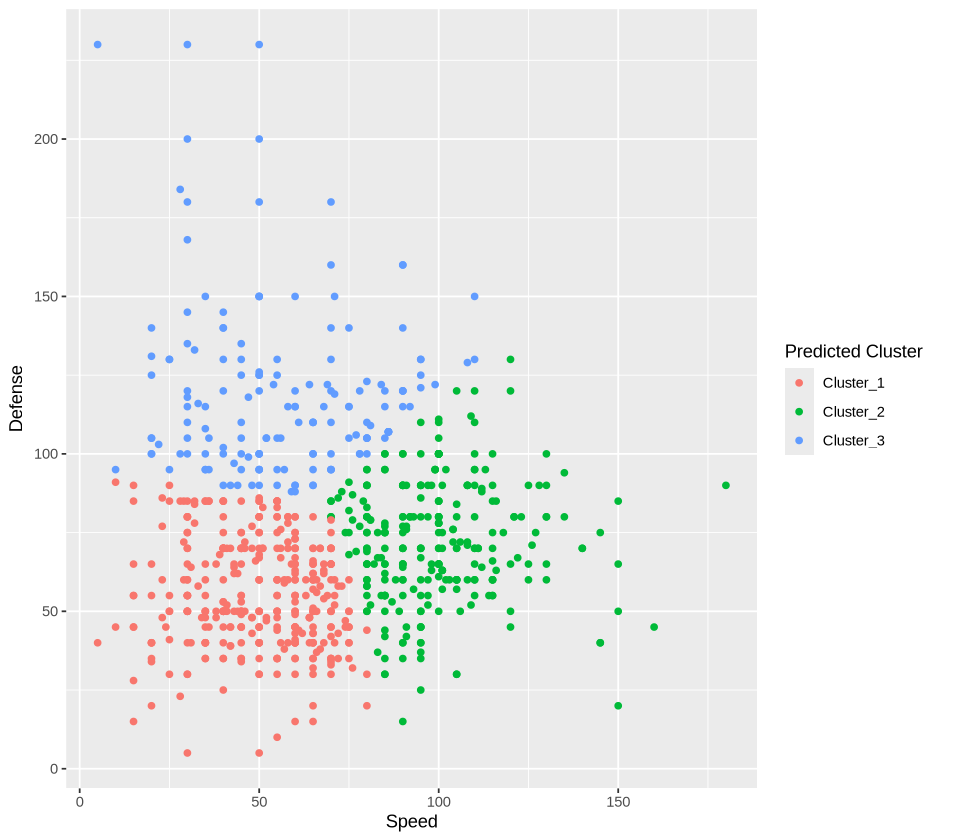

In [10]:
set.seed(2019) # DO NOT REMOVE
# your code here

pokemon_final_spec <- k_means(num_clusters = 3) |>
        set_engine("stats", nstart = 10)
pokemon_final_spec

pokemon_final_kmeans <- workflow() |>
        add_recipe(pokemon_recipe) |>
        add_model(pokemon_final_spec) |>
        fit(data = pokemon)

pokemon_final_clusters <- augment(pokemon_final_kmeans, pokemon)
pokemon_final_clusters

pokemon_final_clusters_plot <- pokemon_final_clusters |>
        ggplot(aes(x = Speed, y = Defense, color = .pred_cluster)) +
        geom_point() +
        labs(x = "Speed", y = "Defense", color = "Predicted Cluster" )


pokemon_final_clusters_plot


# 2. Tourism Reviews

The Ministry of Land, Infrastructure, Transport and Tourism of Japan is interested in knowing the type of tourists that visit East Asia. They know the [majority of their visitors come from this region](https://statistics.jnto.go.jp/en/graph/) and would like to stay competitive in the region to keep growing the tourism industry. For this, they have hired us to perform segmentation of the tourists. A [dataset from TripAdvisor](https://archive.ics.uci.edu/ml/datasets/Travel+Reviews) has been scraped and it's provided to you.

This dataset contains the following variables:

- User ID : Unique user id 
- Category 1 : Average user feedback on art galleries 
- Category 2 : Average user feedback on dance clubs 
- Category 3 : Average user feedback on juice bars 
- Category 4 : Average user feedback on restaurants 
- Category 5 : Average user feedback on museums 
- Category 6 : Average user feedback on resorts 
- Category 7 : Average user feedback on parks/picnic spots 
- Category 8 : Average user feedback on beaches 
- Category 9 : Average user feedback on theaters 
- Category 10 : Average user feedback on religious institutions

**Question 2.0**
<br> {points: 3}

Load the data set from https://archive.ics.uci.edu/ml/machine-learning-databases/00484/tripadvisor_review.csv and clean it so that only the Category # columns are in the data frame (i.e., remove the `User ID` column). 

Assign your answer to an object called `clean_reviews`.

In [11]:
# your code here

review_data <- read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00484/tripadvisor_review.csv")
review_data

clean_reviews <- review_data |>
            select(-"User ID")
clean_reviews

Rows: 980 Columns: 11
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): User ID
dbl (10): Category 1, Category 2, Category 3, Category 4, Category 5, Catego...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


User ID,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
User 1,0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
User 2,1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
User 3,1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
User 978,0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02
User 979,0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46
User 980,0.93,0.56,1.13,0.51,1.34,2.36,3.18,2.87,1.34,2.40


Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02
0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46
0.93,0.56,1.13,0.51,1.34,2.36,3.18,2.87,1.34,2.40


**Question 2.1**
<br> {points: 3}

Perform K-means and vary $K$ from 1 to 10 to identify the optimal number of clusters. Use `nstart = 100`. Assign your answer to a tibble object called `tourism_elbow_stats` that has the columns `num_clusters` and `total_WSSD`.

Afterwards, create an elbow plot to help you choose $K$. Assign your answer to an object called `tourism_elbow_plot`.

*Note: You may see a warning message indicating that your model did not converge within 10 iterations. Please ignore this message.*



── Recipe ──────────────────────────────────────────────────────────────────────



── Inputs 

Number of variables by role

predictor: 10



── Operations 

• Scaling for: all_predictors()

• Centering for: all_predictors()



num_clusters
<int>
1
2
3
⋮
8
9
10


K Means Cluster Specification (partition)

Main Arguments:
  num_clusters = tune()

Engine-Specific Arguments:
  nstart = 100

Computational engine: stats 


! Apparent: preprocessor 1/1, model 10/10: did not converge in 10 iterations



num_clusters,.metric,.estimator,.estimate,.config
<int>,<chr>,<chr>,<dbl>,<chr>
1,sse_within_total,standard,9790.000,Preprocessor1_Model01
1,sse_total,standard,9790.000,Preprocessor1_Model01
2,sse_within_total,standard,7759.473,Preprocessor1_Model02
⋮,⋮,⋮,⋮,⋮
9,sse_total,standard,9790.000,Preprocessor1_Model09
10,sse_within_total,standard,4678.027,Preprocessor1_Model10
10,sse_total,standard,9790.000,Preprocessor1_Model10


num_clusters,total_WSSD
<int>,<dbl>
1,9790.000
2,7759.473
3,7090.652
⋮,⋮
8,5055.061
9,4841.085
10,4678.027


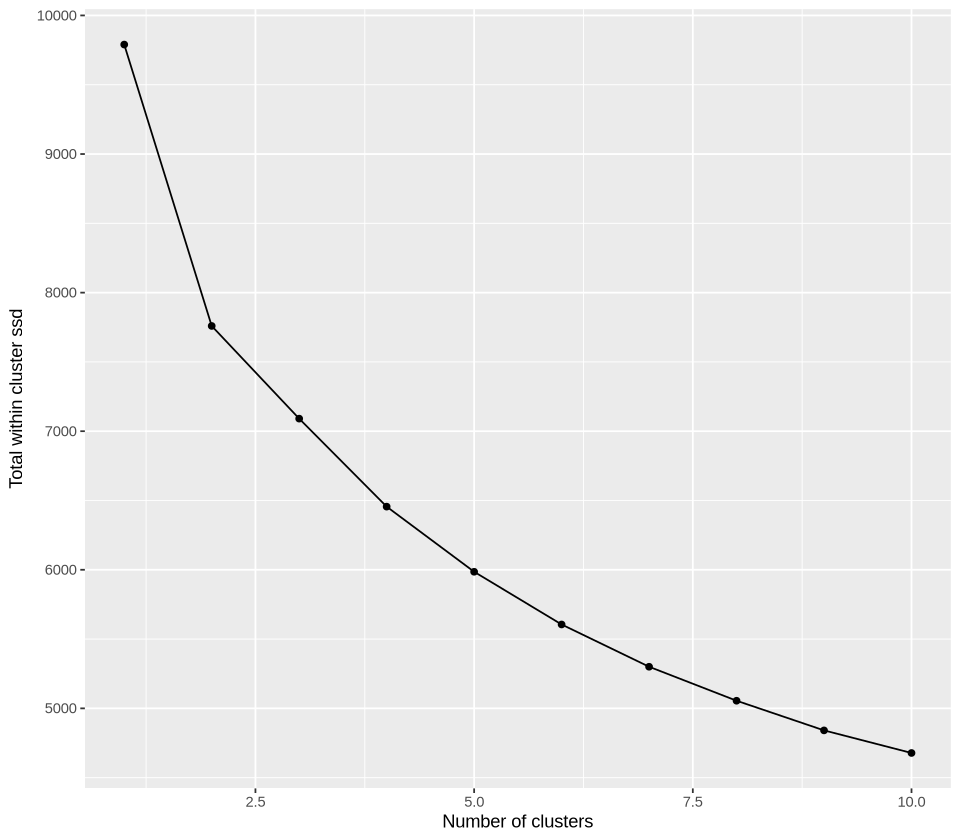

In [12]:
#DON'T CHANGE THIS SEED VALUE
set.seed(2019)

# your code here
tourism_recipe <- recipe( ~ . , data = clean_reviews) |> 
        step_scale(all_predictors()) |>
        step_center(all_predictors())
tourism_recipe

tourism_ks <- tibble(num_clusters = 1:10)
tourism_ks

tourism_spec_tune <- k_means(num_clusters = tune()) |>
        set_engine("stats", nstart = 100)
tourism_spec_tune

tourism_tuning_stats <- workflow() |>
        add_recipe(tourism_recipe) |>
        add_model(tourism_spec_tune) |>
        tune_cluster(resamples = apparent(clean_reviews), grid = tourism_ks) #|>
#        collect_metrics()
tourism_tuning_stats <- tourism_tuning_stats$.metrics[[1]]

tourism_tuning_stats

tourism_elbow_stats <- tourism_tuning_stats |>
        filter(.metric == "sse_within_total") |>
        mutate(total_WSSD = .estimate) |>
        select(num_clusters, total_WSSD)

tourism_elbow_stats

tourism_elbow_plot <- tourism_elbow_stats |>
        ggplot(aes(x = num_clusters, y = total_WSSD)) +
        geom_line() + 
        geom_point() +
        labs(x = "Number of clusters", y = "Total within cluster ssd")

tourism_elbow_plot

**Question 2.2** 
<br> {points: 3}

From the elbow plot above, which $K$ should you choose? Explain why you chose that $K$.

##### Answer: One might reasonably argue for any value of $K$ between 2 and 5. The change in total within cluster ssd decreases steadily for values of $K$ greater than 5. I will choose a value of 4, since the change from $K = 3$ to $K = 4$ is similar to that of $K = 2$ to $K = 3$, but somewhat larger than subsequent changes.

**Question 2.3**
<br> {points: 3}

Run kmeans again, with the optimal $K$, and assign your answer to an object called `reviews_clusters`. Use `nstart = 100`. Then, use the `augment` function to get the cluster assignments for each point. Name the data frame `cluster_assignments`.

In [13]:
#DONT CHANGE THIS SEED VALUE
set.seed(2019)

# your code here
tourism_final_spec <- k_means(num_clusters = 4) |>
        set_engine("stats", nstart = 100)
tourism_final_spec

review_clusters <- workflow() |>
        add_recipe(tourism_recipe) |>
        add_model(tourism_final_spec) |>
        fit(data = clean_reviews)

cluster_assignments <- augment(review_clusters, clean_reviews)
cluster_assignments


K Means Cluster Specification (partition)

Main Arguments:
  num_clusters = 4

Engine-Specific Arguments:
  nstart = 100

Computational engine: stats 


.pred_cluster,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cluster_1,0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
Cluster_1,1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
Cluster_2,1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
Cluster_2,0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02
Cluster_2,0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46
Cluster_1,0.93,0.56,1.13,0.51,1.34,2.36,3.18,2.87,1.34,2.40


For the following 2 questions use the following plot as reference. 

> The visualization below is a density plot, you can think of it as a smoothed version of a histogram. Density plots are more effective for comparing multiple distributions. What we are looking for with these visualizations, is to see which variables have difference distributions between the different clusters.

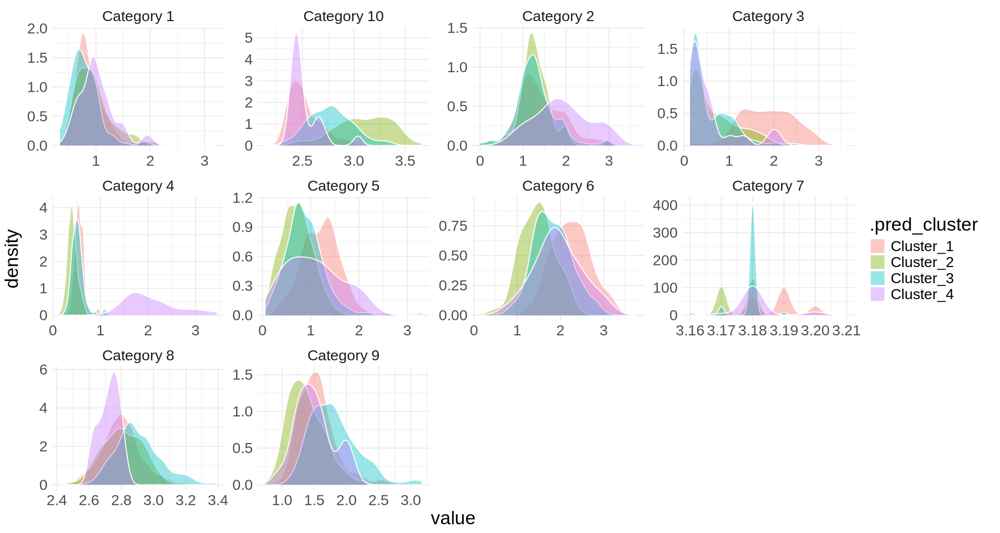

In [14]:
options(repr.plot.height = 8, repr.plot.width = 15)
cluster_assignments |>
    pivot_longer(cols = -.pred_cluster, names_to = 'category', values_to = 'value')  |> 
    ggplot(aes(value, fill = .pred_cluster)) +
        geom_density(alpha = 0.4, colour = 'white') +
        # We are setting the x-scale to "free" since we standardized the rating values before clustering them,
        # which means that their original range (which is what we show here) does not matter
        facet_wrap(facets = vars(category), scales = 'free') +
        theme_minimal() +
        theme(text = element_text(size = 20))

**Question 2.4** Multiple Choice:
<br> {points: 1}

From the plots above, point out the categories that we might hypothesize are driving the clustering? (i.e., are useful to distinguish between the type of tourists?) We list the table of the categories below. 

- Category 1 : Average user feedback on art galleries 
- Category 2 : Average user feedback on dance clubs 
- Category 3 : Average user feedback on juice bars 
- Category 4 : Average user feedback on restaurants 
- Category 5 : Average user feedback on museums 
- Category 6 : Average user feedback on resorts 
- Category 7 : Average user feedback on parks/picnic spots 
- Category 8 : Average user feedback on beaches 
- Category 9 : Average user feedback on theaters 
- Category 10 : Average user feedback on religious institutions

A. 10, 3, 5, 6, 7

B. 10, 3, 5, 6, 1

C. 10, 3, 4, 6, 7

D. 10, 2, 5, 6, 7


##### Answer: C